# The advection equation
Numerical solution of the 1D advection problem
$$ \frac{\partial T}{\partial t} =  -c \frac{\partial T}{\partial x}$$ 
using an explicit forward in time, centred in space scheme

$T(x,t)$ represents the evolution of temperature distribution along the estuary over time

## all the graphs are provided in a PDF document to show the output 

#### AI declaration
Gemini and ChatGPT was used to assist with fixing errors and improving the line of code and plot visuals refining it to add the description of the plots and some of the questions were copied and paste from the exercise in order to get the code to be used in this exercise to improve the code, it was also used to improve the plots explaination to make it sound better.

Example prompts that were used: 'how can i improve this plot should and add growth phases', 'help me fix this error', 'please help meet fix gram spelling and making flow.'

#### AI declaration
Gemini and ChatGPT was used to assist with fixing errors and improving the line of code and plot visuals refining it to add the description of the plots and some of the questions were copied and paste from the exercise in order to get the code to be used in this exercise to improve the code, it was also used to improve the plots explaination to make it sound better.

Example prompts that were used: 'how can i improve this plot should and add growth phases', 'help me fix this error', 'please help meet fix gram spelling and making flow.'

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

## User defined parameters

In [4]:
# problem parameters
c=0.26       # Advection speed [m s-1]
dx=150      # X resolution [m]
dt=200     # time step [s]
t0=0.       # initial time
tmax=0.1    # duration of simulation [days]
xmax=10.0e3 # length of the basin [m]

# Parameters of the initial temperature distribution
T0 = 15.        # baseline temperature [degC]
sigma = 2500.   # width at half amplitude [m]
A = 5.          # amplitude [degC]

## Initial function and grid specifications
The initial shape of the temperature distribution is a Gaussian peak function

In [5]:
# Spatial shape of the temperature disturbance
def Gaussian(x):
    y = T0+A*np.exp(-(x/sigma)**2)
    return y

The resulting space-time grid depends on the parameters above

In [6]:
# time axis
NT = int(np.floor(tmax*86400/dt))+1  # number of steps (starts from 0)
# X axis (centred at 0)
x = np.arange(-xmax,xmax,dx)
IM = len(x)             # number of grid points
T = np.zeros([IM,NT])     # the array holding the numerical solution 
print('Grid steps : ',IM)
print('Number of time steps : ',NT)
print('Timestep = ',dt,' s')
print('Max numerical speed DX/DT = ',dx/dt,' m/s')
print('Physical speed = ',c,' m/s')
print('Courant number = ',c*dt/dx)

Grid steps :  134
Number of time steps :  44
Timestep =  200  s
Max numerical speed DX/DT =  0.75  m/s
Physical speed =  0.26  m/s
Courant number =  0.3466666666666667


## Numerical solution
Note that this code stores the solution at all times in array T for educational purposes. This allows to plot the solution at the different time steps and see how it evolves.

*This method is very inefficient for any application because it uses a lot of memory. In modern computer codes only a few time records are hold in memory. The instantaneous solution is often temporarely stored for computing time averages and then discarded.*

This part of the code is the topic of some questions found in the lecture notes

In [7]:
# Compute the numerical solution using a time loop over the number of time steps
T[:,0] = Gaussian(x)    # initial condition

for n in range(NT-1):
    # Question 1
    T[0,n+1]  = T0
    T[-1,n+1] = T0
    # Question 2 and Question 3
    rhs = -c*(T[2:,n]-T[:-2,n])/(2.*dx) # L1
    T[1:-1,n+1] = T[1:-1,n] + rhs*dt    # L2

## Plot the result using a matplotlib animation
The animation below displays the evolution of the solution and compares it with the analytical solution

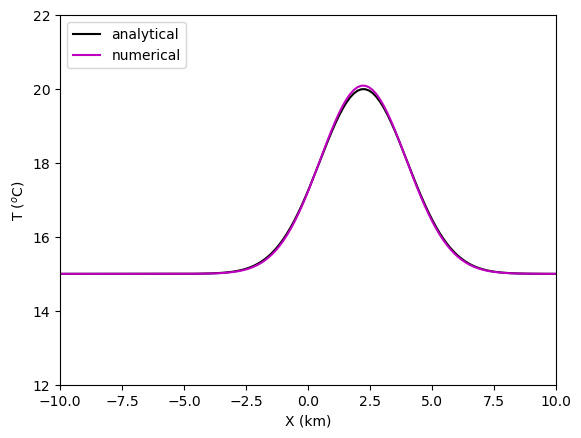

In [8]:
fig, ax = plt.subplots()
# set the axis limits
plt.axis([-xmax/1000, xmax/1000, T0-3, T0+7])
# first plot the initial conditions and set the line attributes
line, = ax.plot(x/1000., Gaussian(x),'k',label='analytical')
sol, = ax.plot(x/1000., T[:,0],'m',label='numerical')
ax.set_xlabel('X (km)')
ax.set_ylabel('T ($^o$C)')
plt.legend(loc='upper left')

def animate(i):
    t = t0 + i*dt
    line.set_ydata(Gaussian(x-c*t))  # update the analytical solution
    sol.set_ydata(T[:,i])  # update the numerical solution
    return line,sol,

# create the animation and loop (interval is in ms)
ani = animation.FuncAnimation(
    fig, animate, interval=dt, blit=True, frames=NT, repeat=True)

# To save the animation, use e.g.
# ani.save("movie.mp4")
# or
# writer = animation.FFMpegWriter(
#     fps=15, metadata=dict(artist='Me'), bitrate=1800)
# ani.save("movie.mp4", writer=writer)

# display the animation as a javascript object embedded in the notebook
from IPython.display import HTML
HTML(ani.to_jshtml())

1. Changing dx affects the analytical solution. Smaller values of dx produce a smoother perturbation resulting to the numerical solution became closer to the analytical solution. Larger values of dx produce undershoot of numerical solution with a shapre curve.
2. The effect of change in speed. Increasing c causes the Gaussian pulse to move faster through the domain, while decreasing c causes it to move more slowly. The shape and amplitude of the pulse remain unchanged because the analytical solution simply translates the perturbation without distortion.
3. Effect of sigma.smaller values of sigma produce a narrow, steep pulse with strong gradients, whereas larger values produce a broader and smoother pulse, therefore the change in sigma onle affect the shape of the pertubation but does not affect the speed

# EXERCISE 11

##### Question 1-Look for the comment #Question 1 in the code. What do you think the next two lines do? [hint: see slide fr:PDE-problems

This equations  are used to describe quantities that change continuously in time and space, the boundary conditions setting the one to the left and right condition to a constant value for every time steps to ensure that the domain is fixed.

#### Question 2- Which component of the numerical scheme is implemented in line #L1? What does line #L2 do?
Line L1: Implements the spatial discretization of the PDE using a second-order centered difference approximation

L2: Advances the solution from time level n to n+1 using the Forward Euler explicit time-stepping scheme

#### Question 3-Why the code does not perform the computation on all the elements of the array T, i.e.T[:,n]?
The code does not use T[:, n] because the numerical scheme can only be applied to the interior grid points, not the boundary points.

#### Question 4- Analysis of the numerical solution. How different is the numerical solution from the expected moving perturbation? What is the possible reason?
The numerical solution differs from the expected moving perturbation because it does not keep it original shape moving in oscillation that moves with speed without changing its shape growing with time. the possible reason is that the Forward Euler in time and centered difference in space is unstable for the advection equation and the numerical errors are amplified during the integration, causing the solution to become increasingly inaccurate with time.


#### Question 5

In [64]:
# problem parameters
c=0.5      # Advection speed [m s-1]
dx=500      # X resolution [m]
dt=100     # time step [s]
t0=0.       # initial time
tmax=0.1    # duration of simulation [days]
xmax=10.0e3 # length of the basin [m]

# Parameters of the initial temperature distribution
T0 = 15.        # baseline temperature [degC]
sigma = 2000.  
A = 5.          # amplitude [degC]

In [65]:
# time axis
NT = int(np.floor(tmax*86400/dt))+1  # number of steps (starts from 0)
# X axis (centred at 0)
x = np.arange(-xmax,xmax,dx)
IM = len(x)             # number of grid points
T = np.zeros([IM,NT])     # the array holding the numerical solution 
print('Grid steps : ',IM)
print('Number of time steps : ',NT)
print('Timestep = ',dt,' s')
print('Max numerical speed DX/DT = ',dx/dt,' m/s')
print('Physical speed = ',c,' m/s')
print('Courant number = ',c*dt/dx)

Grid steps :  40
Number of time steps :  87
Timestep =  100  s
Max numerical speed DX/DT =  5.0  m/s
Physical speed =  0.5  m/s
Courant number =  0.1


In [66]:
# Compute the numerical solution using a time loop over the number of time steps
T[:,0] = Gaussian(x)    # initial condition

for n in range(NT-1):
    # Question 1
    T[0,n+1]  = T0
    T[-1,n+1] = T0
    # Question 2 and Question 3
    rhs = -c*(T[2:,n]-T[:-2,n])/(2.*dx) # L1
    T[1:-1,n+1] = T[1:-1,n] + rhs*dt    # L2

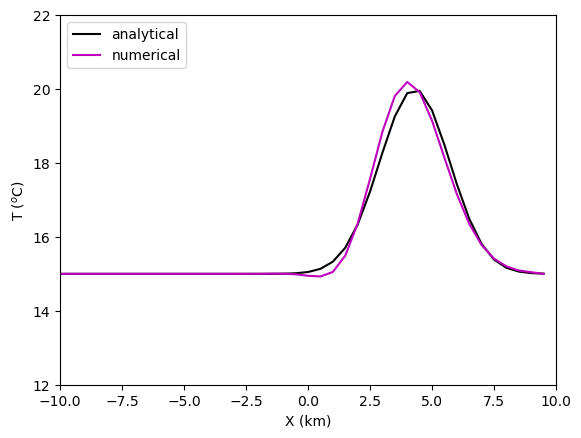

In [67]:
fig, ax = plt.subplots()
# set the axis limits
plt.axis([-xmax/1000, xmax/1000, T0-3, T0+7])
# first plot the initial conditions and set the line attributes
line, = ax.plot(x/1000., Gaussian(x),'k',label='analytical')
sol, = ax.plot(x/1000., T[:,0],'m',label='numerical')
ax.set_xlabel('X (km)')
ax.set_ylabel('T ($^o$C)')
plt.legend(loc='upper left')

def animate(i):
    t = t0 + i*dt
    line.set_ydata(Gaussian(x-c*t))  # update the analytical solution
    sol.set_ydata(T[:,i])  # update the numerical solution
    return line,sol,

# create the animation and loop (interval is in ms)
ani = animation.FuncAnimation(
    fig, animate, interval=dt, blit=True, frames=NT, repeat=True)

# To save the animation, use e.g.
# ani.save("movie.mp4")
# or
# writer = animation.FFMpegWriter(
#     fps=15, metadata=dict(artist='Me'), bitrate=1800)
# ani.save("movie.mp4", writer=writer)

# display the animation as a javascript object embedded in the notebook
from IPython.display import HTML
HTML(ani.to_jshtml())

##### For question 5 Observation are on the PDF with all the plots

Increasing the Courant number towards 1 generally improves the representation of the moving perturbation and reduces numerical diffusion,by halving dx, to 250. The perturbation travels finer, numerical solution closely matches the analytical solution, with very little stable of the wave shape since the courant number is 0.2

For dx=500 m and dt=100 s, the Courant number is C=0.1. The numerical solution no longer matches the analytical solution perfectly and develops oscillations around. The Courant number is now small, the FTCS advection scheme is unstable resulting to numerical errors.The numerical solution became much closer to the analytical solution, with a small undershoot remains near the leading edge, but it is much weaker.

### Question 6

In [84]:
# problem parameters
c= 2    # Advection speed [m s-1]
dx=250      # X resolution [m]
dt=50     # time step [s]
t0=0.       # initial time
tmax=0.1    # duration of simulation [days]
xmax=10.0e3 # length of the basin [m]

# Parameters of the initial temperature distribution
T0 = 15.        # baseline temperature [degC]
sigma = 1000.   # width at half amplitude [m]
A = 5.          # amplitude [degC]

In [85]:
# time axis
NT = int(np.floor(tmax*86400/dt))+1  # number of steps (starts from 0)
# X axis (centred at 0)
x = np.arange(-xmax,xmax,dx)
IM = len(x)             # number of grid points
T = np.zeros([IM,NT])     # the array holding the numerical solution 
print('Grid steps : ',IM)
print('Number of time steps : ',NT)
print('Timestep = ',dt,' s')
print('Max numerical speed DX/DT = ',dx/dt,' m/s')
print('Physical speed = ',c,' m/s')
print('Courant number = ',c*dt/dx)

Grid steps :  80
Number of time steps :  173
Timestep =  50  s
Max numerical speed DX/DT =  5.0  m/s
Physical speed =  2  m/s
Courant number =  0.4


In [86]:
# Compute the numerical solution using a time loop over the number of time steps
T[:,0] = Gaussian(x)    # initial condition

for n in range(NT-1):
    # Question 1
    T[0,n+1]  = T0
    T[-1,n+1] = T0
    # Question 2 and Question 3
    rhs = -c*(T[2:,n]-T[:-2,n])/(2.*dx) # L1
    T[1:-1,n+1] = T[1:-1,n] + rhs*dt    # L2

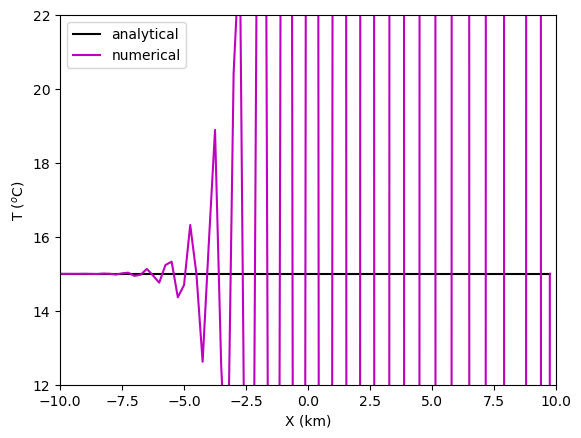

In [87]:
fig, ax = plt.subplots()
# set the axis limits
plt.axis([-xmax/1000, xmax/1000, T0-3, T0+7])
# first plot the initial conditions and set the line attributes
line, = ax.plot(x/1000., Gaussian(x),'k',label='analytical')
sol, = ax.plot(x/1000., T[:,0],'m',label='numerical')
ax.set_xlabel('X (km)')
ax.set_ylabel('T ($^o$C)')
plt.legend(loc='upper left')

def animate(i):
    t = t0 + i*dt
    line.set_ydata(Gaussian(x-c*t))  # update the analytical solution
    sol.set_ydata(T[:,i])  # update the numerical solution
    return line,sol,

# create the animation and loop (interval is in ms)
ani = animation.FuncAnimation(
    fig, animate, interval=dt, blit=True, frames=NT, repeat=True)

# To save the animation, use e.g.
# ani.save("movie.mp4")
# or
# writer = animation.FFMpegWriter(
#     fps=15, metadata=dict(artist='Me'), bitrate=1800)
# ani.save("movie.mp4", writer=writer)

# display the animation as a javascript object embedded in the notebook
from IPython.display import HTML
HTML(ani.to_jshtml())

if the sigma is set to 1000, it gradient becomes more steeper creating shaper frequency,with a large undershoot and overshooting remains near the leading edge, therefore the perturbation becomes narrower and steeper, since the numerical solution becomes less accurate because the steep gradients are poorly resolved by the grid.To recover the same degree of accuracy of the previous solution is by making dx and dt smaller, e.g(dx=250 and dt=50) this will maintain the stability of the courany number to be low. This is observed in the PDF document.

If the current speed doubled by 2, the perturbation propagates faster through the domain and the Courant number increases and also get doubled. If the grid parameters are unchanged, numerical errors become larger and the solution may become less accurate